# Post processing

Guojie Zhong, Jiayao Wang, Siyu He



In [5]:
import sys
IN_COLAB = "google.colab" in sys.modules
# check if colab is in the sys.modules
if IN_COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  save_path = "/content/drive/MyDrive/ML_project/Results"
  !pip3 install scanpy
    
%matplotlib inline
import matplotlib.pyplot as plt
import os
import pandas as pd
import skimage as ski
from skimage import io, filters,measure,morphology,color,segmentation
import scipy.ndimage as ndi
import numpy as np
from sklearn.neighbors import NearestNeighbors
!pip3 install PhenoGraph
!pip3 install scanpy
import phenograph
import scanpy as sc
!pip3 install umap-learn
import seaborn as sns
import umap
from sklearn.manifold import TSNE
from collections import Counter
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
cd drive/MyDrive/ML_project

/content/drive/.shortcut-targets-by-id/1jMEyx5V4eJqIx2Td7hs6opw0G60PHMr_/ML_project


In [6]:
ls

 bar_plot_with_error_bars.png   Liger/              SFARI.genes.csv
 Code/                          LigerAutoEncoder/   spatial_RNA_raw/
 dat/                           PBMC/               spatial_scRNA_dat/
'Final Report.gdoc'             Result/             TODO.gdoc
 gencode.vM25.annotation.gtf    scATAC_raw/
'Interim Report.gdoc'           scRNA_dat/


## Comparison between AE and LIGRT with multiple latent metrics using PBMC datasets

### Latent mixing metric: negative entropy

In [7]:
def latent_metrice_entropy(latent_df,metadata, epoch =10):
    latent_array = np.array(latent_df)
    nbrs = NearestNeighbors(n_neighbors=100, algorithm='ball_tree').fit(latent_array)
    distances, indices = nbrs.kneighbors(latent_array)
    temp = np.array(metadata.reindex(latent_df.index)['CellType'])
    #temp = np.array(metadata.reindex(latent_df.index)['celltype.label'])
    
    batch_type=[i for i in np.unique(temp)]
    batch_id = []
    entropy = []
    for cell in metadata.reindex(latent_df.index)['CellType']:
        batch_id.append(batch_type.index(cell))
    batch_id = np.array(batch_id)

    for rand_i in range(epoch):
        rand_perm = np.random.randint(0, high=latent_df.shape[0]-1, size=100)
        distances_100 = distances[rand_perm]
        indices_100 = indices[rand_perm]

        p_in = np.empty((len(batch_type), 100), float)
        for i in range(len(batch_type)):
            for n in range(100):
                p_in[i,n] = (batch_id[indices_100[n,:]] ==i).sum()/100
        
        q_i = np.empty((len(batch_type),1), float)
        for i in range(len(batch_type)):
            q_i[i] = (batch_id ==i).sum() / (batch_id.shape[0])


        entropy_i = (p_in * np.log(p_in/q_i+0.1)).sum(axis=0) 
        entropy_i = entropy_i.mean()
        entropy.append(entropy_i)

    return entropy


In [8]:
liger_latent = pd.read_csv('/content/drive/MyDrive/ML_project/Result/PBMC/liger.PBMC.latent.csv', sep=',',index_col=0)
liger_latent_reindex = []
for i in range(liger_latent.index.shape[0]):
    liger_latent_reindex.append(liger_latent.index[i].replace('.', '-') )
liger_latent.index = liger_latent_reindex
ae_latent_file = '/content/drive/MyDrive/ML_project/Result/PBMC/latent_df_PBMC.latent.20.loss_lambda_5.csv'
ae_latent = pd.read_csv(ae_latent_file, sep=',',index_col=0)

In [439]:
liger_latent.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20
data_3p-AAACCTGAGCATCATC-0,0.006093,0.000000,0.006981,0.000000,0.000000,0.000000,0.002370,0.029068,0.003797,0.003050,0.000000,0.008348,0.0,0.000000,0.012054,0.000732,0.000000,0.000000,0.004093,0.000557
data_3p-AAACCTGAGCTAGTGG-0,0.031962,0.001607,0.000031,0.000000,0.000000,0.000149,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.026829,0.000000,0.000000,0.001666,0.000281,0.010110,0.001215
data_3p-AAACCTGCACATTAGC-0,0.007078,0.000000,0.000088,0.000796,0.000000,0.022295,0.008077,0.002205,0.000000,0.000000,0.000000,0.002973,0.0,0.002524,0.000986,0.000000,0.001163,0.000160,0.004753,0.000000
data_3p-AAACCTGCACTGTTAG-0,0.000000,0.000000,0.000417,0.011261,0.004016,0.000000,0.000000,0.000000,0.000000,0.015613,0.000000,0.016269,0.0,0.000000,0.000000,0.000000,0.026499,0.003487,0.008378,0.005363
data_3p-AAACCTGCATAGTAAG-0,0.000000,0.008087,0.000000,0.000000,0.022330,0.000000,0.000000,0.000244,0.000332,0.039025,0.001107,0.009186,0.0,0.000375,0.000000,0.000695,0.020509,0.000000,0.001781,0.006695


In [440]:
ae_latent.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,batches
data_3p-GTCGTAAAGACAAGCC-0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.242577,0.0,0.000000,0.000000,0.077101,0.0,0.060239,0.0,0.0,0.0,0
data_3p-CAGCGACAGATCCGAG-0,0.177627,0.186998,0.000000,0.376559,0.392535,0.000000,0.110400,0.0,0.115640,0.0,0.370039,0.0,0.171963,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0
data_3p-ACAGCTAGTGCGAAAC-0,0.062225,0.015623,0.000000,0.445963,0.320919,0.000000,0.000000,0.0,0.319901,0.0,0.402200,0.0,0.287318,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0
data_5p-CATCCACCAATCGGTT-1,0.491851,0.505597,0.000000,0.077320,0.443375,0.000000,0.347122,0.0,0.446909,0.0,0.215384,0.0,0.452343,0.000000,0.000000,0.0,0.124210,0.0,0.0,0.0,1
data_3p-CGTAGGCGTCAGGACA-0,0.000000,0.000000,0.030312,0.000000,0.000000,0.274875,0.000000,0.0,0.000000,0.0,0.244295,0.0,0.000000,0.130069,0.227288,0.0,0.258465,0.0,0.0,0.0,0


In [441]:
metadata_01 = pd.read_csv('/content/drive/MyDrive/ML_project/Result/PBMC/b1_celltype.txt',sep="\t",index_col=0)
metadata_02 = pd.read_csv('/content/drive/MyDrive/ML_project/Result/PBMC/b2_celltype.txt',sep="\t",index_col=0)
metadata = pd.concat([metadata_01,metadata_02],axis=0)

In [442]:
metadata.head()

,Sample,n_counts,n_genes,batch,louvain,anno,Method,CellType
data_3p-AAACCTGAGCATCATC-0,data_3p,2394,871,0,9,B cell,10X_3prime,B cell
data_3p-AAACCTGAGCTAGTGG-0,data_3p,4520,1316,0,5,CD4 T cell,10X_3prime,CD4 T cell
data_3p-AAACCTGCACATTAGC-0,data_3p,2788,898,0,1,CD4 T cell,10X_3prime,CD4 T cell
data_3p-AAACCTGCACTGTTAG-0,data_3p,4667,1526,0,0,Monocyte_CD14,10X_3prime,Monocyte_CD14
data_3p-AAACCTGCATAGTAAG-0,data_3p,4440,1495,0,0,Monocyte_CD14,10X_3prime,Monocyte_CD14


In [443]:
entropy_ae = latent_metrice_entropy(ae_latent,metadata, epoch =50)
entropy_liger = latent_metrice_entropy(liger_latent,metadata, epoch =50)

In [444]:
entropy_ae_mean = np.mean(entropy_ae)
entropy_liger_mean = np.mean(entropy_liger)
entropy_ae_std = np.std(entropy_ae)
entropy_liger_std = np.std(entropy_liger)
labels = ['AE', 'LIGER']
x_pos = np.arange(len(labels))
Means = [entropy_ae_mean, entropy_liger_mean]
error = [entropy_ae_std, entropy_liger_std]

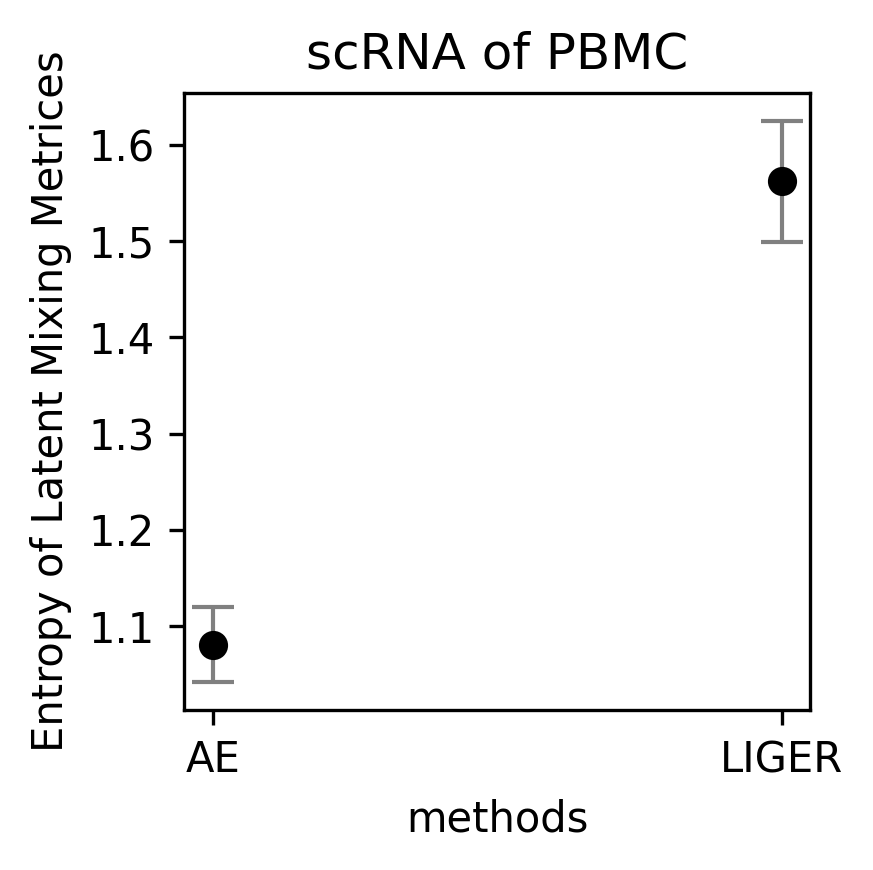

In [453]:
plt.subplots(figsize=(3,3),dpi=300)
my_xticks = ['AE','LIGER']
plt.errorbar(x_pos,Means, yerr = error, fmt= 'o',color='black',ecolor='grey',elinewidth=1,capsize=5)
plt.title('scRNA of PBMC')
plt.xticks(x_pos, my_xticks)
plt.ylabel("Entropy of Latent Mixing Metrices")
plt.xlabel('methods')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/entropy_pbmc.pdf',dpi=600)

### Latent mixing metric: clustering F1scores

In [446]:
def most_frequent(List):
    occurence_count = Counter(List)
    return occurence_count.most_common(1)[0][0]

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


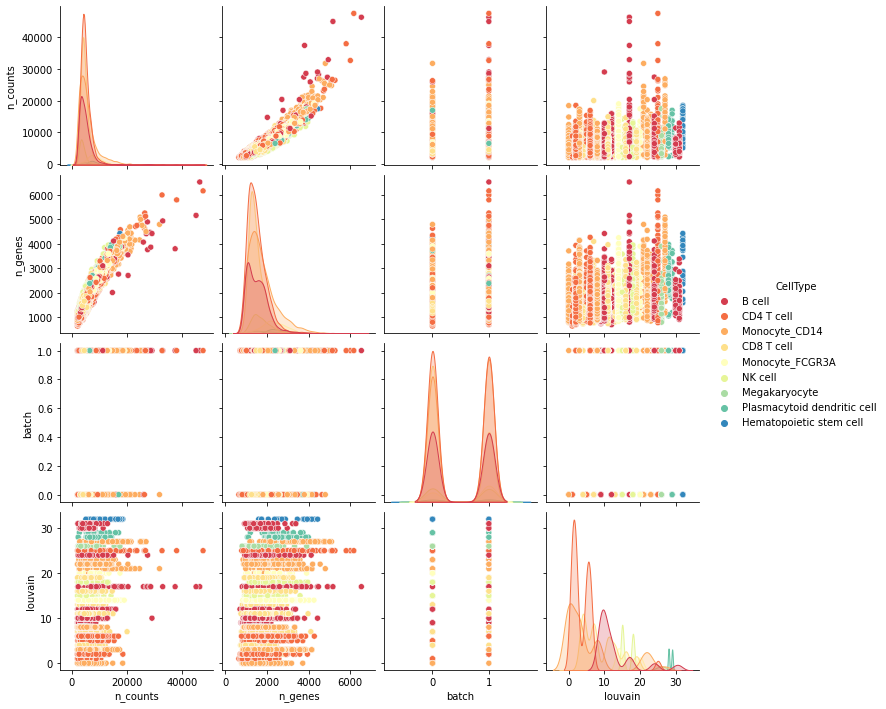

In [447]:
sns.pairplot(metadata, hue='CellType',palette='Spectral')
plt.savefig('/content/drive/MyDrive/ML_project/Result/pairplot_pbmc.pdf',dpi=600)

###### liger

In [276]:
#liger_latent
k = 15
communities, graph, Q = phenograph.cluster(liger_latent,k=k,seed=234) # run PhenoGraph
liger_latent = pd.concat([liger_latent, pd.DataFrame(communities.astype(str),index=liger_latent.index,columns=['cluster_liger'])], axis=1)

Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 8.154122114181519 seconds
Jaccard graph constructed in 2.5051658153533936 seconds
Wrote graph to binary file in 1.09865140914917 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.900212
Louvain completed 21 runs in 41.03606057167053 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 53.011277198791504 seconds


In [277]:
liger_embedded = TSNE(n_components=2).fit_transform(liger_latent)
temp1 = np.array(metadata.reindex(liger_latent.index)['CellType'])
temp2 = np.array(liger_latent['cluster_liger'])
liger_embedded = pd.concat([pd.DataFrame(liger_embedded),pd.DataFrame(temp1),pd.DataFrame(temp2)],axis=1)
liger_embedded.columns=['tsne1','tsne2','type','phenograph']

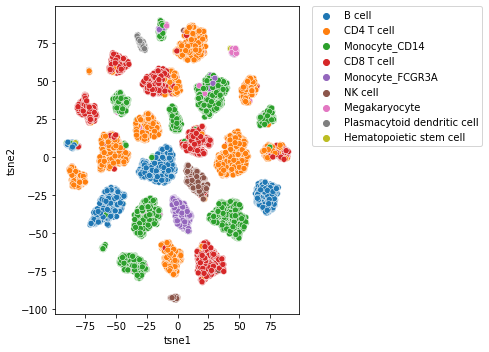

In [461]:
plt.figure(figsize=(7,5))
sns.scatterplot(data=liger_embedded, x="tsne1", y="tsne2",hue='type')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/tsne_pbmc.pdf',dpi=600)

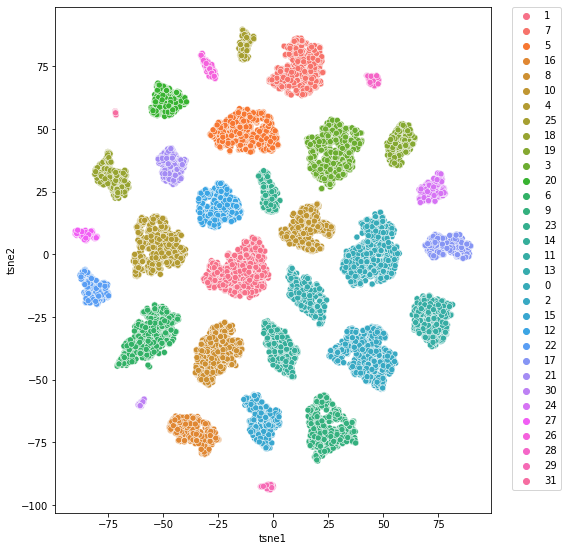

In [464]:
plt.figure(figsize=(8,8))
sns.scatterplot(data=liger_embedded, x="tsne1", y="tsne2",hue='phenograph')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/tsne_pbmc_liger.pdf',dpi=600)

In [465]:
true_type = np.array(metadata.reindex(liger_latent.index)['CellType'])
assignment_liger = []
for i in np.unique(liger_embedded['phenograph']):
    assignment_liger.append([i,most_frequent(true_type[liger_embedded['phenograph']==i])])
assignment_liger = np.array(assignment_liger)
predicted_type = []
for i in np.array(liger_embedded['phenograph']):
    predicted_type.append(assignment_liger[np.where(assignment_liger[:,0]==i),1][0][0])
predicted_type = np.array(predicted_type)

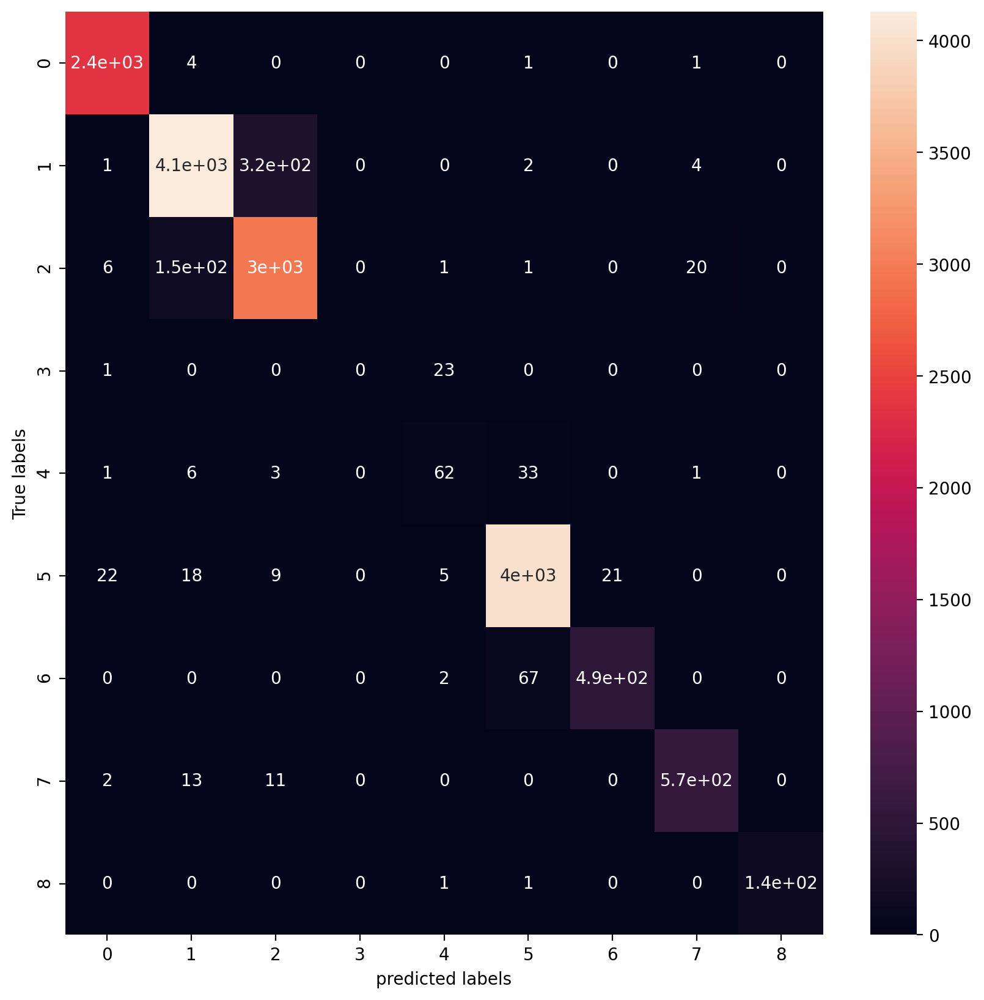

In [472]:
# Display the confusion matrix
CM = confusion_matrix(true_type, predicted_type)

plt.figure(figsize=(10,10),dpi=200)
sns.heatmap(CM, annot = True, annot_kws = {"size": 10})
#plt.ylim([0, 10]);
plt.ylabel('True labels');
plt.xlabel('predicted labels');
plt.savefig('/content/drive/MyDrive/ML_project/Result/confusion_matrix——liger_pbmc.pdf',dpi=600)

In [473]:
print(classification_report(true_type, predicted_type))

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                             precision    recall  f1-score   support

                     B cell       0.99      1.00      0.99      2371
                 CD4 T cell       0.95      0.93      0.94      4450
                 CD8 T cell       0.90      0.94      0.92      3142
    Hematopoietic stem cell       0.00      0.00      0.00        24
              Megakaryocyte       0.66      0.58      0.62       106
              Monocyte_CD14       0.97      0.98      0.98      4090
            Monocyte_FCGR3A       0.96      0.88      0.92       561
                    NK cell       0.96      0.96      0.96       593
Plasmacytoid dendritic cell       1.00      0.99      0.99       139

                   accuracy                           0.95     15476
                  macro avg       0.82      0.81      0.81     15476
               weighted avg       0.95      0.95      0.95     15476



###### ae

In [283]:
# ae_latent
k = 15
communities, graph, Q = phenograph.cluster(ae_latent,k=k,seed=234) # run PhenoGraph
ae_latent = pd.concat([ae_latent, pd.DataFrame(communities.astype(str),index=ae_latent.index,columns=['cluster_ae'])], axis=1)

Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 2.1870858669281006 seconds
Jaccard graph constructed in 2.5815227031707764 seconds
Wrote graph to binary file in 1.1063077449798584 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.924329
After 6 runs, maximum modularity is Q = 0.925332
Louvain completed 26 runs in 50.857908964157104 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 56.94973158836365 seconds


In [284]:
ae_embedded = TSNE(n_components=2).fit_transform(ae_latent)
temp1 = np.array(metadata.reindex(ae_latent.index)['CellType'])

In [285]:
temp2 = np.array(ae_latent['cluster_ae'])
ae_embedded = pd.concat([pd.DataFrame(ae_embedded),pd.DataFrame(temp1),pd.DataFrame(temp2)],axis=1)

In [286]:
ae_embedded.columns=['tsne1','tsne2','type','phenograph']

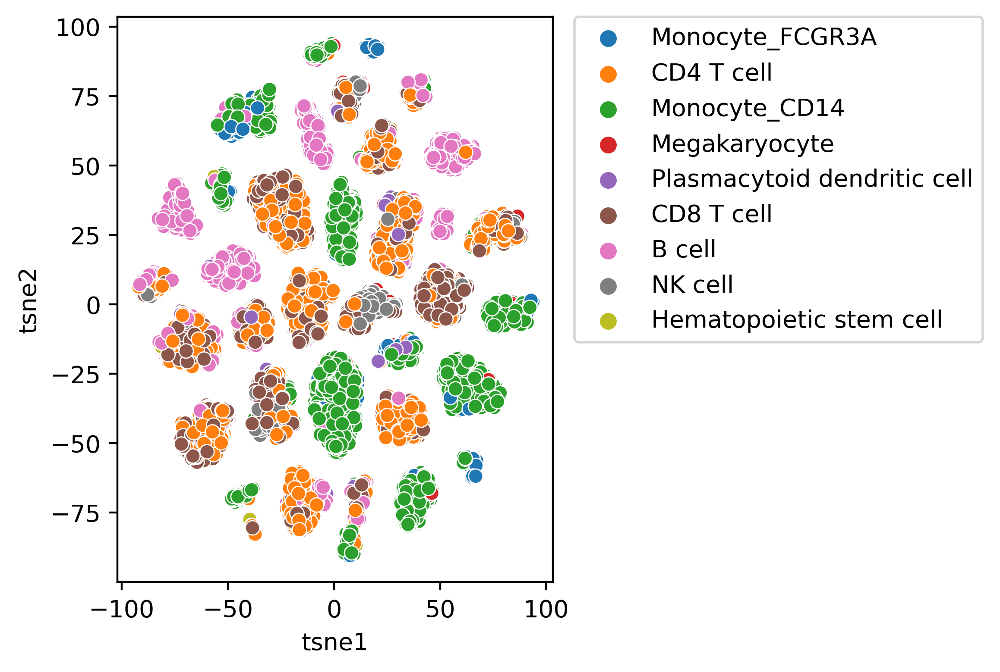

In [474]:
plt.figure(dpi=400)
sns.scatterplot(data=ae_embedded, x="tsne1", y="tsne2",hue='type')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/tsne_pbmc_ae.pdf',dpi=600)

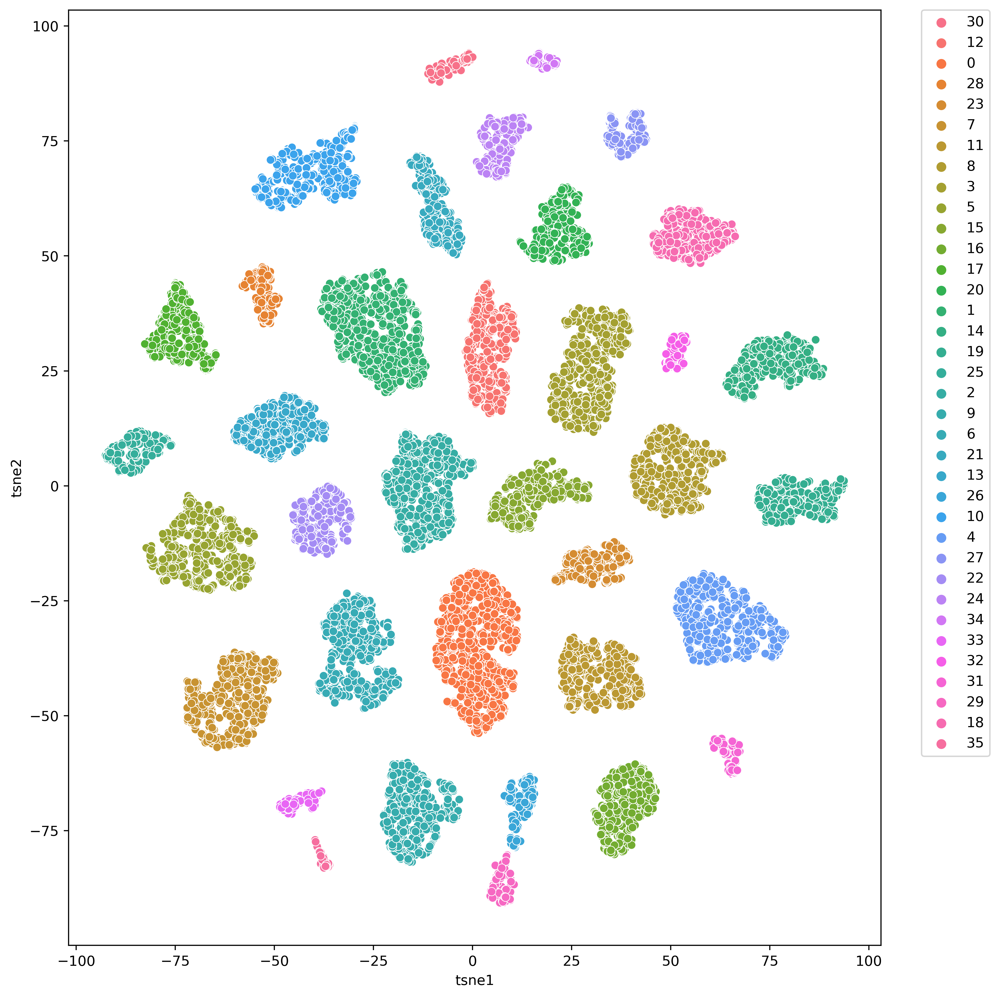

In [476]:
plt.figure(figsize=(10,10),dpi=400)
sns.scatterplot(data=ae_embedded, x="tsne1", y="tsne2",hue='phenograph')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/tsne_pbmc_ae——ae.pdf',dpi=600)

In [289]:
def most_frequent(List):
    occurence_count = Counter(List)
    return occurence_count.most_common(1)[0][0]

In [479]:
assignment_ae = []
for i in np.unique(ae_embedded['phenograph']):
    assignment_ae.append([i,most_frequent(temp1[ae_embedded['phenograph']==i])])
assignment_ae = np.array(assignment_ae)
predicted_type = []
for i in np.array(ae_embedded['phenograph']):
    predicted_type.append(assignment_ae[np.where(assignment_ae[:,0]==i),1][0][0])
predicted_type = np.array(predicted_type)

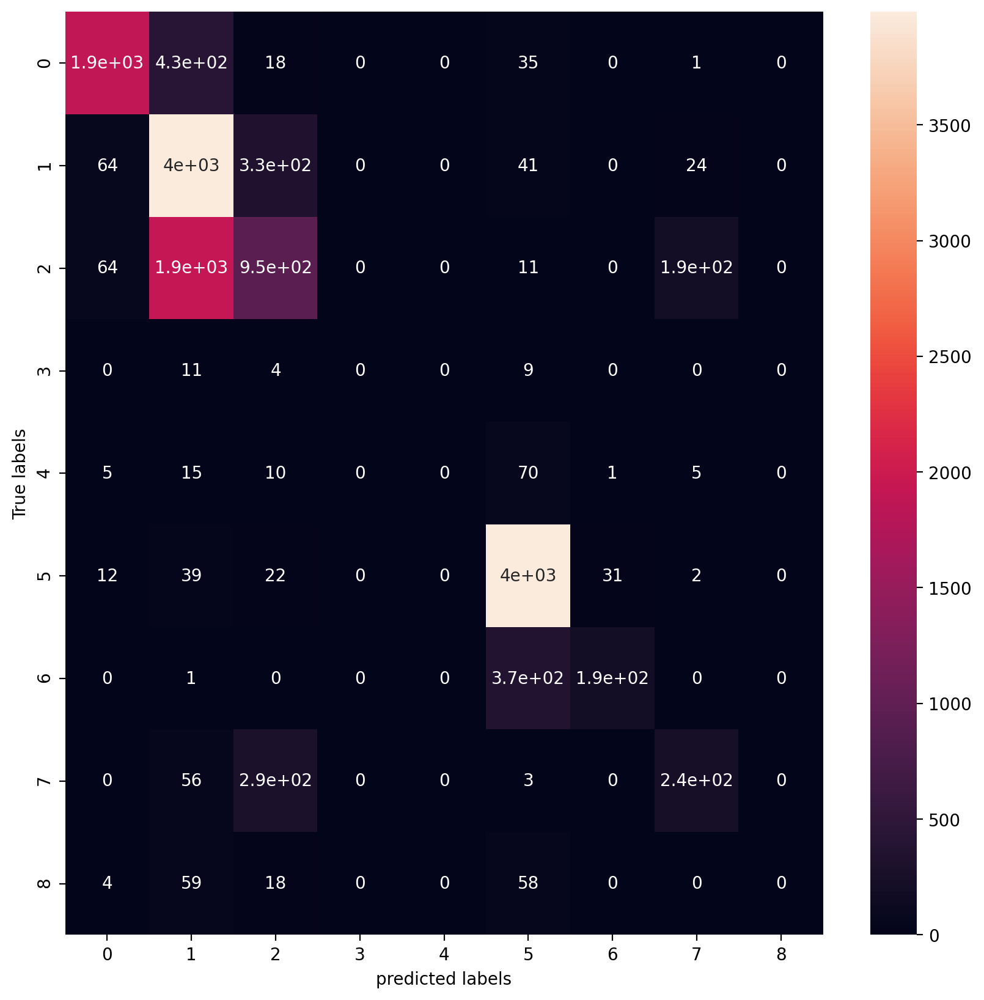

In [481]:
# Display the confusion matrix
# Display the confusion matrix
CM = confusion_matrix(temp1, predicted_type)

plt.figure(figsize=(10,10),dpi=200)
sns.heatmap(CM, annot = True, annot_kws = {"size": 10})
#plt.ylim([0, 10]);
plt.ylabel('True labels');
plt.xlabel('predicted labels');
plt.savefig('/content/drive/MyDrive/ML_project/Result/confusion_matrix——ae_pbmc.pdf',dpi=600)


In [1]:
print(classification_report(temp1, predicted_type))

NameError: ignored

## Mouse embryo brain data

### load spatial information/spatial scRNA

In [9]:
img_dir = 'spatial_RNA_raw/GSE137986_RAW' # folder
image_file = 'GSM4189614_0713cL-25um-e10.png' #brain
#image_file = 'GSM4364242_E11-1L.png' # eye 

In [10]:
spatial_RNA_file = 'spatial_scRNA_dat/GSM4189614_0713cL.tsv' #brain 
#spatial_RNA_file = 'spatial_scRNA_dat/GSM4364242_E11-1L.tsv' # eye
spatial_RNA = pd.read_csv(os.path.join(spatial_RNA_file), sep='\t',index_col=0)

In [11]:
img = ski.io.imread(os.path.join(img_dir, image_file))
im_gray = ski.color.rgb2gray(img)
im_gray = im_gray.max() - im_gray 
im_gray = (im_gray-im_gray.min())/im_gray.max()
thresh = ski.filters.threshold_otsu(im_gray)
bw = ski.morphology.closing(im_gray > 0.02)
bw = ndi.binary_fill_holes(bw)
cleaned = ski.morphology.remove_small_objects(bw, min_size=3, connectivity=1)
label_image = ski.measure.label(cleaned)

In [12]:
pixel = 50
pixel_count = 2*pixel-1
[numRows,numCols] = label_image.shape
pixel_w = numCols/pixel_count
pixel_h = numRows/pixel_count
img_ = []
for i in range(1,50):
    y = int(np.round(2*(i-1)*pixel_h + 1))
    for j in range(1,50):
        x = int(np.round(2*(j-1)*pixel_w + 1))
        Intensity = im_gray[y:int(np.round(y+pixel_h-1)),x:int(np.round(x+pixel_w-1))]
        In = np.sum(Intensity)
        pixel = label_image[y:int(np.round(y+pixel_h-1)),x:int(np.round(x+pixel_w-1))]
        C = np.sum(pixel)
        if C > 0:
            img_.append([j,i,str(j)+'x'+str(i),In,C])
img_ = pd.DataFrame(img_,columns=['x','y','loc_','spot_value','spot_num'])

In [13]:
ind=[]
for i in range(img_.shape[0]):
  if img_['loc_'][i] in spatial_RNA.columns:
    ind.append(i)
img_ = img_.iloc[ind]

In [14]:
spatialRNA_filter = spatial_RNA[img_['loc_']]

In [15]:
spatialRNA_filter.shape

(18787, 1748)

### liger latent

In [16]:
# liger latent
liger_latent = pd.read_csv('/content/drive/MyDrive/ML_project/Result/GSM4189614/GSM4189614 .latent.norm.csv', sep=',',index_col=0) ## brain

In [17]:
liger_latent

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20
sci3-me-001.TACGGTAGTAAGACCGTTG,0.000000,0.003266,0.007618,0.003532,0.000000,0.007216,2.236947e-03,0.003729,7.816827e-07,0.000005,0.000622,0.000000,0.000000,0.016037,0.000288,0.003132,1.842045e-03,0.000000,0.000000,0.000000e+00
sci3-me-001.TATAAGAGGTCCAGTTCCAA,0.000571,0.000016,0.000013,0.000000,0.000000,0.000000,6.503781e-08,0.005115,5.361723e-04,0.000005,0.003154,0.008628,0.000000,0.011150,0.002401,0.008551,3.609728e-06,0.000000,0.008762,0.000000e+00
sci3-me-001.ATTAGTCTGTTATATACTAA,0.000002,0.000000,0.000015,0.028775,0.001076,0.000229,0.000000e+00,0.000000,0.000000e+00,0.000004,0.000525,0.000000,0.000000,0.003827,0.001042,0.000000,4.260670e-02,0.000000,0.001071,0.000000e+00
sci3-me-001.TCCAATAGTTTCTTGCCGAC,0.004694,0.000653,0.016459,0.000000,0.003361,0.000715,9.749011e-03,0.000000,0.000000e+00,0.000621,0.000768,0.003726,0.001372,0.000000,0.000000,0.001941,3.421430e-04,0.000000,0.006014,1.555973e-03
sci3-me-001.AAATTCCTCTAATACCATCC,0.001858,0.000000,0.042753,0.000549,0.005372,0.000000,2.133141e-03,0.000349,0.000000e+00,0.000000,0.000004,0.005238,0.003719,0.000000,0.000000,0.002686,6.253658e-03,0.000000,0.000005,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
X42x40,0.005157,0.000597,0.001343,0.007704,0.000000,0.003225,1.534239e-04,0.000461,0.000000e+00,0.000079,0.001070,0.011655,0.000000,0.000000,0.000124,0.005060,1.711487e-03,0.000136,0.000533,0.000000e+00
X42x41,0.000031,0.001084,0.003364,0.000000,0.000000,0.001568,0.000000e+00,0.000389,9.739598e-05,0.000651,0.000000,0.005067,0.040683,0.000005,0.000204,0.001595,9.153997e-07,0.009645,0.000153,1.241323e-03
X42x42,0.007726,0.000509,0.000767,0.000004,0.000589,0.005097,1.172617e-06,0.000059,2.223221e-03,0.000075,0.000000,0.005515,0.002738,0.000499,0.004867,0.009607,2.030587e-06,0.000169,0.002940,1.973399e-08
X42x43,0.005698,0.000597,0.000000,0.000687,0.000776,0.000056,2.353011e-03,0.000008,6.497567e-03,0.000079,0.000000,0.005987,0.001688,0.007631,0.008345,0.000000,2.428306e-04,0.000136,0.017776,1.351944e-03


### autoencoder latent

In [18]:
# GSM4364242/ae latent
#ae_latent = 'LigerAutoEncoder/latent_df.csv'
#ae_latent_file = 'LigerAutoEncoder/latent_df_spatial_brain.csv' ##brain
ae_latent_file = 'LigerAutoEncoder/latent_df_spatial_brain.loss_lambda_5.csv' ##brain
#ae_latent_file = '/content/drive/MyDrive/ML_project/Result/PBMC/latent_df_PBMC.latent.20.loss_lambda_5.csv'
ae_latent = pd.read_csv(ae_latent_file, sep=',',index_col=0)

In [19]:
ae_latent.head()

,0,1,2,3,4,5,6,7,8,9,batches
sci3-me-474.GCGGTATATTAGCCGTCAT,0.000000,0.000000,0.126057,0.113242,0.099001,0.012510,0.127111,0.000000,0.151131,0.378053,1
sci3-me-548.CTGGAAGATTCAACGTAAG,0.000000,0.000000,0.000000,0.958852,0.000000,0.000000,0.087648,0.631506,0.000000,0.000000,1
sci3-me-468.TCGAAGGATAATACCATCC,0.000000,0.378341,0.000000,0.424070,0.000000,0.000000,0.000000,0.421206,0.000000,0.000000,1
sci3-me-530.ACGACGCATTAGAGTAATA,2.057246,0.000000,0.800952,0.000000,1.649214,1.398997,1.204556,0.000000,1.447812,1.792726,1
sci3-me-189.CTGCTGAATAATCGATAAT,0.000000,0.515303,0.000000,0.422267,0.000000,0.000000,0.000000,0.558267,0.000000,0.000000,1


### load metadata

In [20]:
metadata = pd.read_csv('/content/drive/MyDrive/ML_project/Result/GSM4189614/GSM4189614 .all.tsne.coord.scv', sep=',',index_col=0)

In [21]:
metadata.head()

,V1,V2,batch.label,celltype.label,cell.coordinate.X,cell.coordinate.Y
sci3-me-001.TACGGTAGTAAGACCGTTG,5.315276,3.155145,scRNA,Excitatory neurons,NaN,NaN
sci3-me-001.TATAAGAGGTCCAGTTCCAA,10.404022,2.883132,scRNA,Oligodendrocyte Progenitors,NaN,NaN
sci3-me-001.ATTAGTCTGTTATATACTAA,-0.551590,10.997453,scRNA,Sensory neurons,NaN,NaN
sci3-me-001.TCCAATAGTTTCTTGCCGAC,-1.400090,3.916351,scRNA,Postmitotic premature neurons,NaN,NaN
sci3-me-001.AAATTCCTCTAATACCATCC,-1.548965,4.698583,scRNA,Postmitotic premature neurons,NaN,NaN


### re-set metadata and latent

In [25]:
scRNA = metadata[metadata['batch.label']=='scRNA']
spatialRNA = metadata[metadata['batch.label']=='spatialRNA']
scATAC = metadata[metadata['batch.label']=='scATAC']

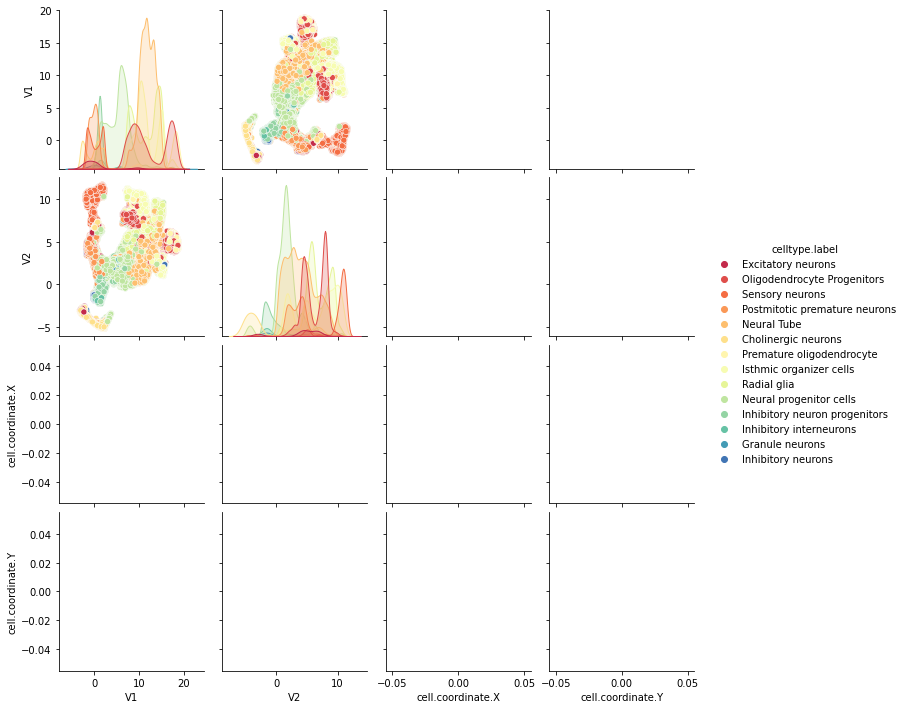

In [26]:
sns.pairplot(scRNA, hue='celltype.label',palette='Spectral')
plt.savefig('/content/drive/MyDrive/ML_project/Result/scRNA_brain.pdf',dpi=600)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


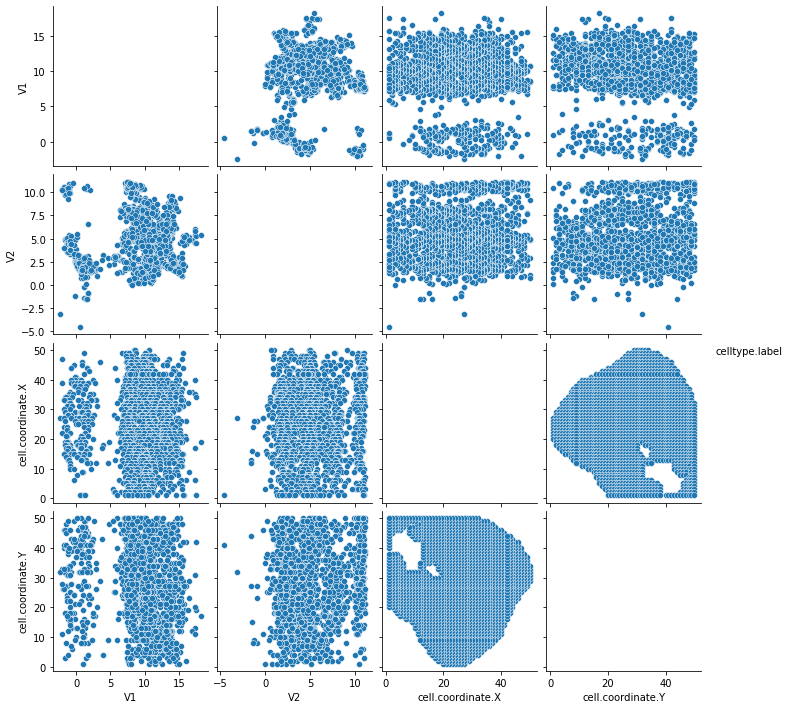

In [27]:
sns.pairplot(spatialRNA, hue='celltype.label',palette='Spectral')
plt.savefig('/content/drive/MyDrive/ML_project/Result/spatialRNA_brain.pdf',dpi=600)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


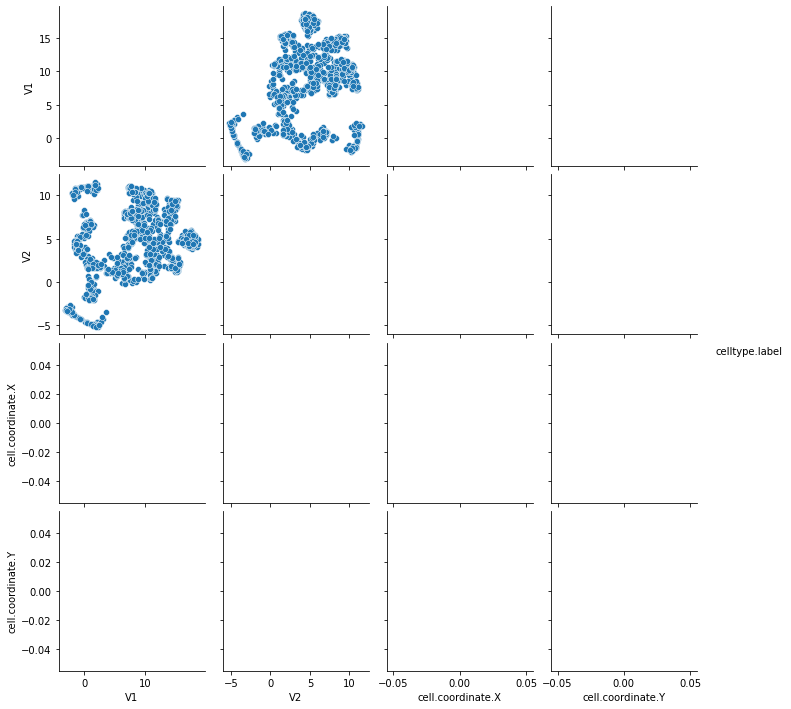

In [28]:
sns.pairplot(scATAC, hue='celltype.label',palette='Spectral')
plt.savefig('/content/drive/MyDrive/ML_project/Result/scATAC_brain.pdf',dpi=600)

In [29]:
spatialRNA_name = np.array(spatialRNA.index)

In [30]:
for i in range(spatialRNA.index.shape[0]):
    spatialRNA_name[i] = spatialRNA_name[i].replace('X', '') 

In [31]:
ae_latent_scRNA = ae_latent.loc[scRNA.index]
ae_latent_spatialRNA = ae_latent.loc[spatialRNA_name]
ae_latent_scATAC = ae_latent.loc[scATAC.index]

liger_latent_scRNA = liger_latent.loc[scRNA.index]
liger_latent_spatialRNA = liger_latent.loc[spatialRNA.index]
liger_latent_scATAC = liger_latent.loc[scATAC.index]

### latent metric

In [34]:
def latent_metrice_entropy(latent_df,metadata, epoch =10):
    latent_array = np.array(latent_df)
    nbrs = NearestNeighbors(n_neighbors=100, algorithm='ball_tree').fit(latent_array)
    distances, indices = nbrs.kneighbors(latent_array)
    #temp = np.array(metadata.reindex(latent_df.index)['CellType'])
    temp = np.array(metadata.reindex(latent_df.index)['celltype.label'])
    
    batch_type=[i for i in np.unique(temp)]
    batch_id = []
    entropy = []
    for cell in metadata.reindex(latent_df.index)['celltype.label']:
        batch_id.append(batch_type.index(cell))
    batch_id = np.array(batch_id)

    for rand_i in range(epoch):
        rand_perm = np.random.randint(0, high=latent_df.shape[0]-1, size=100)
        distances_100 = distances[rand_perm]
        indices_100 = indices[rand_perm]

        p_in = np.empty((len(batch_type), 100), float)
        for i in range(len(batch_type)):
            for n in range(100):
                p_in[i,n] = (batch_id[indices_100[n,:]] ==i).sum()/100
        
        q_i = np.empty((len(batch_type),1), float)
        for i in range(len(batch_type)):
            q_i[i] = (batch_id ==i).sum() / (batch_id.shape[0])


        entropy_i = (p_in * np.log(p_in/q_i+0.1)).sum(axis=0) 
        entropy_i = entropy_i.mean()
        entropy.append(entropy_i)

    return entropy


In [35]:
entropy_ae = latent_metrice_entropy(ae_latent_scRNA,scRNA, epoch =10)
entropy_liger = latent_metrice_entropy(liger_latent_scRNA,scRNA, epoch =10)

In [39]:
entropy_ae_mean = np.mean(entropy_ae)
entropy_liger_mean = np.mean(entropy_liger)
entropy_ae_std = np.std(entropy_ae)
entropy_liger_std = np.std(entropy_liger)

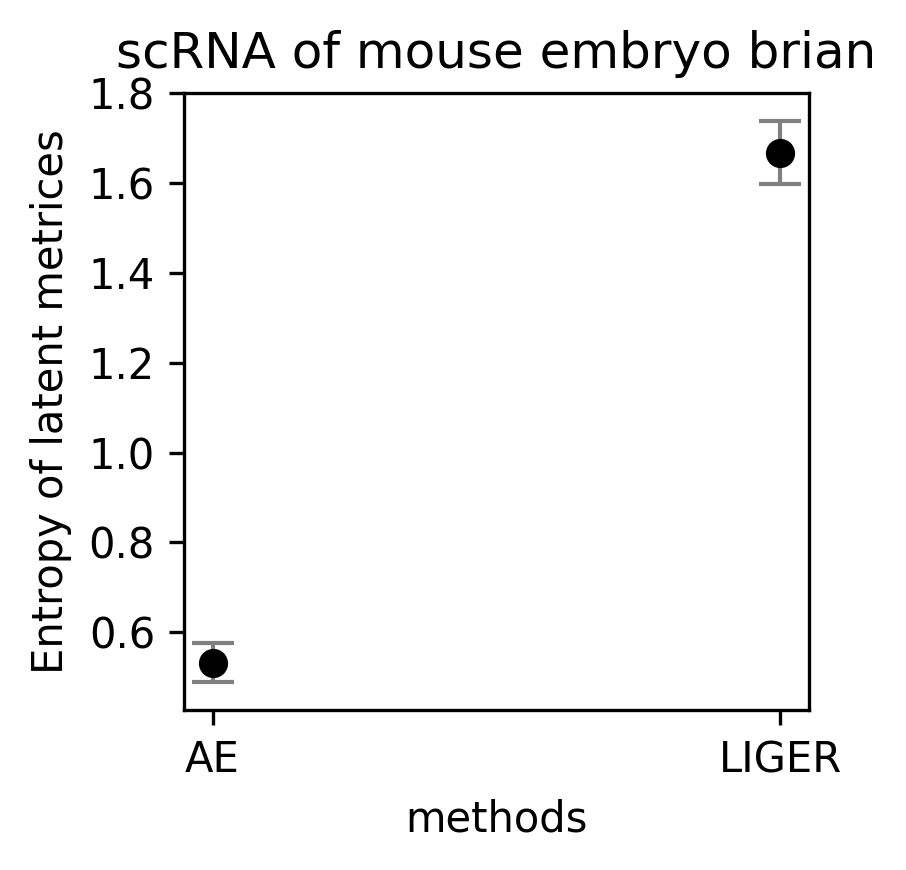

In [43]:
labels = ['AE', 'LIGER']
x_pos = np.arange(len(labels))

Means = [entropy_ae_mean, entropy_liger_mean]
error = [entropy_ae_std, entropy_liger_std]
plt.subplots(figsize=(3,3),dpi=300)
my_xticks = ['AE','LIGER']
plt.errorbar(x_pos,Means, yerr = error, fmt= 'o',color='black',ecolor='grey',elinewidth=1,capsize=5)
plt.title('scRNA of mouse embryo brian')
plt.xticks(x_pos, my_xticks)
plt.ylabel('Entropy of latent metrices')
plt.xlabel('methods')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/entropy_mousebrain.pdf',dpi=600)

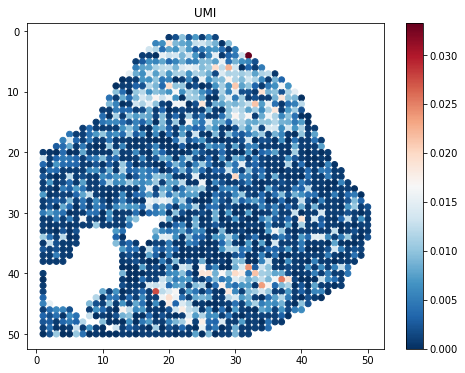

In [44]:
# plot one figure
plt.figure(figsize=(8,6))
plt.scatter(spatialRNA['cell.coordinate.X'],spatialRNA['cell.coordinate.Y'],cmap='RdBu_r',c=liger_latent_spatialRNA['V1'])
plt.colorbar()
plt.title('UMI')
plt.gca().invert_yaxis()

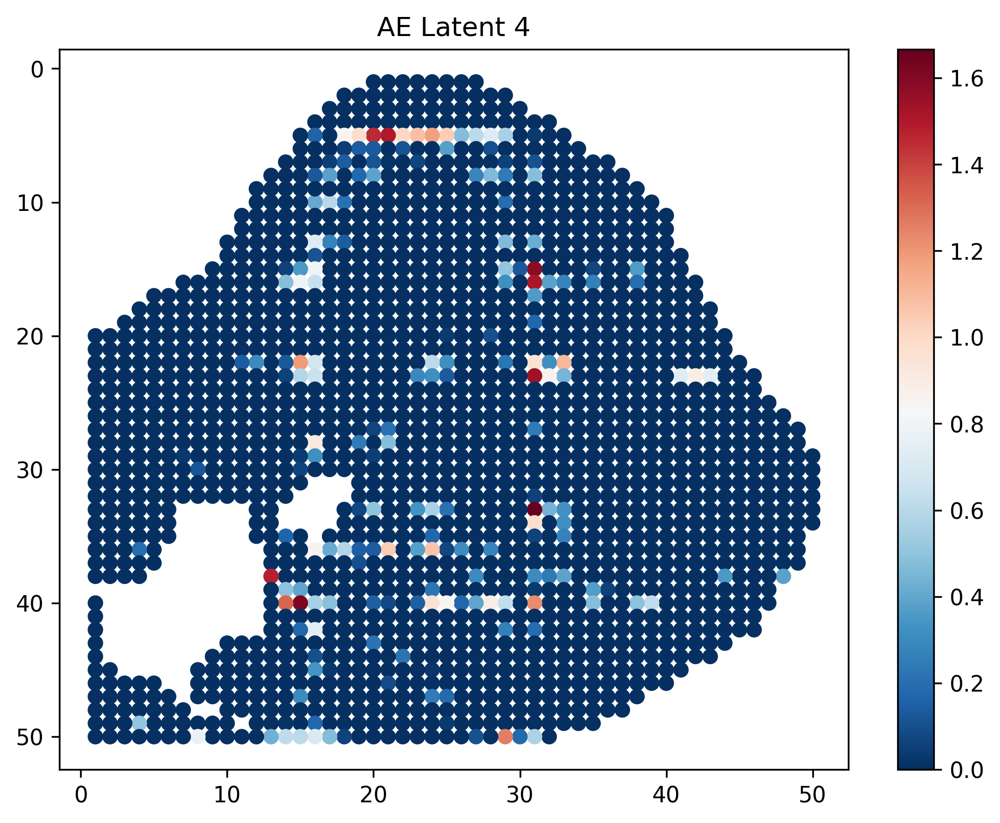

In [54]:
# plot one figure
l_name = '4'
plt.figure(figsize=(8,6),dpi=300)
plt.scatter(spatialRNA['cell.coordinate.X'],spatialRNA['cell.coordinate.Y'],cmap='RdBu_r',c=ae_latent_spatialRNA[l_name])
plt.colorbar()
plt.title('AE Latent 4')
plt.gca().invert_yaxis()

In [ ]:
# multiple figures
l_names = liger_latent_spatialRNA.columns
fig, axs = plt.subplots(5,4,figsize=(30,40),dpi=400)
for col in range(5):
    for row in range(4):
        ax = axs[col,row]
        pcm = ax.scatter(spatialRNA['cell.coordinate.X'],spatialRNA['cell.coordinate.Y'], c=auto_latent_spatialRNA[l_names[col*4+row]], cmap="RdBu_r", s=4)
        color_bar = fig.colorbar(pcm, ax=ax)
        color_bar.set_label(label='Library size', size=12)
        ax.xticks=[]
        ax.yticks=[]
        ax.title.set_text(str(l_names[col*4+row]))
        ax.invert_yaxis()

plt.show()
#plt.gca().invert_yaxis()

No handles with labels found to put in legend.


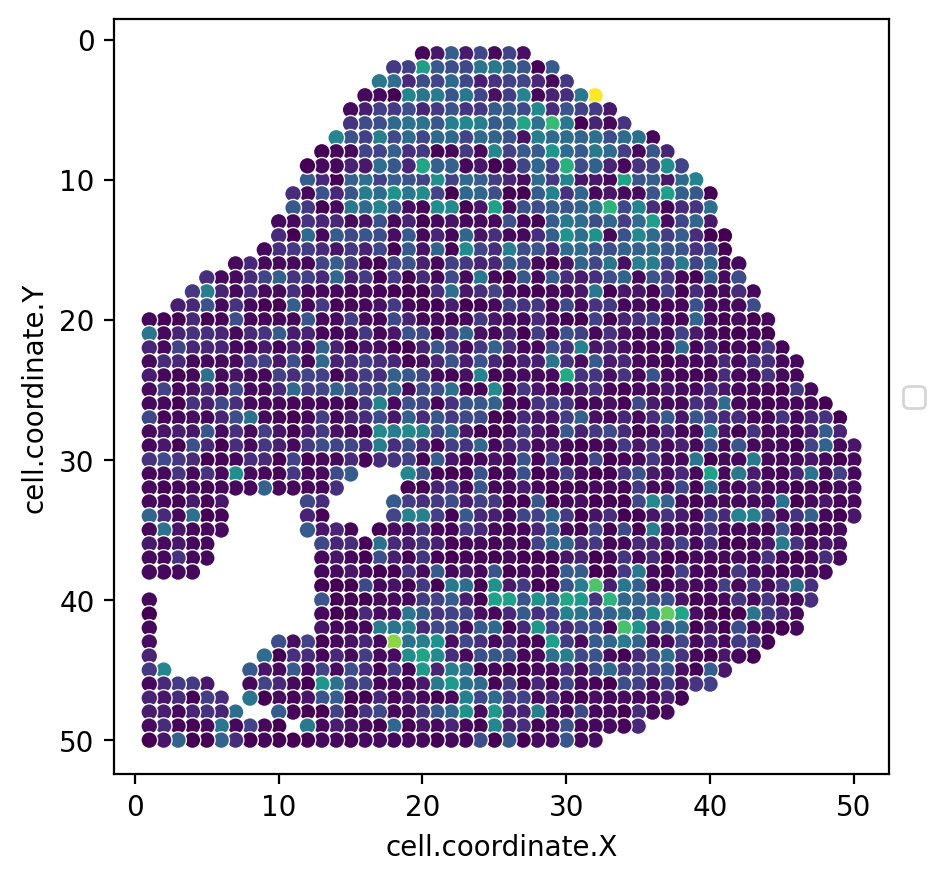

In [55]:
import seaborn as sns
plt.figure(figsize=(5,5),dpi=200)
g = sns.scatterplot(data=spatialRNA, x="cell.coordinate.X", y="cell.coordinate.Y", c=liger_latent_spatialRNA['V1'],palette='RdBu_r')
g.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
g.invert_yaxis()

In [56]:
# ae_latent_scRNA
k = 30
communities, graph, Q = phenograph.cluster(ae_latent_scRNA,k=k,seed=234) # run PhenoGraph

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 52.13749933242798 seconds
Jaccard graph constructed in 65.99410104751587 seconds
Wrote graph to binary file in 24.32726764678955 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.895927
Louvain completed 21 runs in 764.8598086833954 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 908.2454705238342 seconds


In [57]:
scRNA = pd.concat([scRNA, pd.DataFrame(communities,index=scRNA.index,columns=['cluster_ae'])], axis=1)

In [84]:
# ae_latent_spatial
k = 30
communities, graph, Q = phenograph.cluster(ae_latent_spatialRNA,k=k,seed=234) # run PhenoGraph

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11455488204956055 seconds
Jaccard graph constructed in 0.9795591831207275 seconds
Wrote graph to binary file in 0.15581178665161133 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.796703
After 5 runs, maximum modularity is Q = 0.79849
Louvain completed 25 runs in 6.544622421264648 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 8.080099821090698 seconds


In [87]:
spatialRNA = pd.concat([spatialRNA, pd.DataFrame(communities,index=spatialRNA.index,columns=['cluster_ae'])], axis=1)

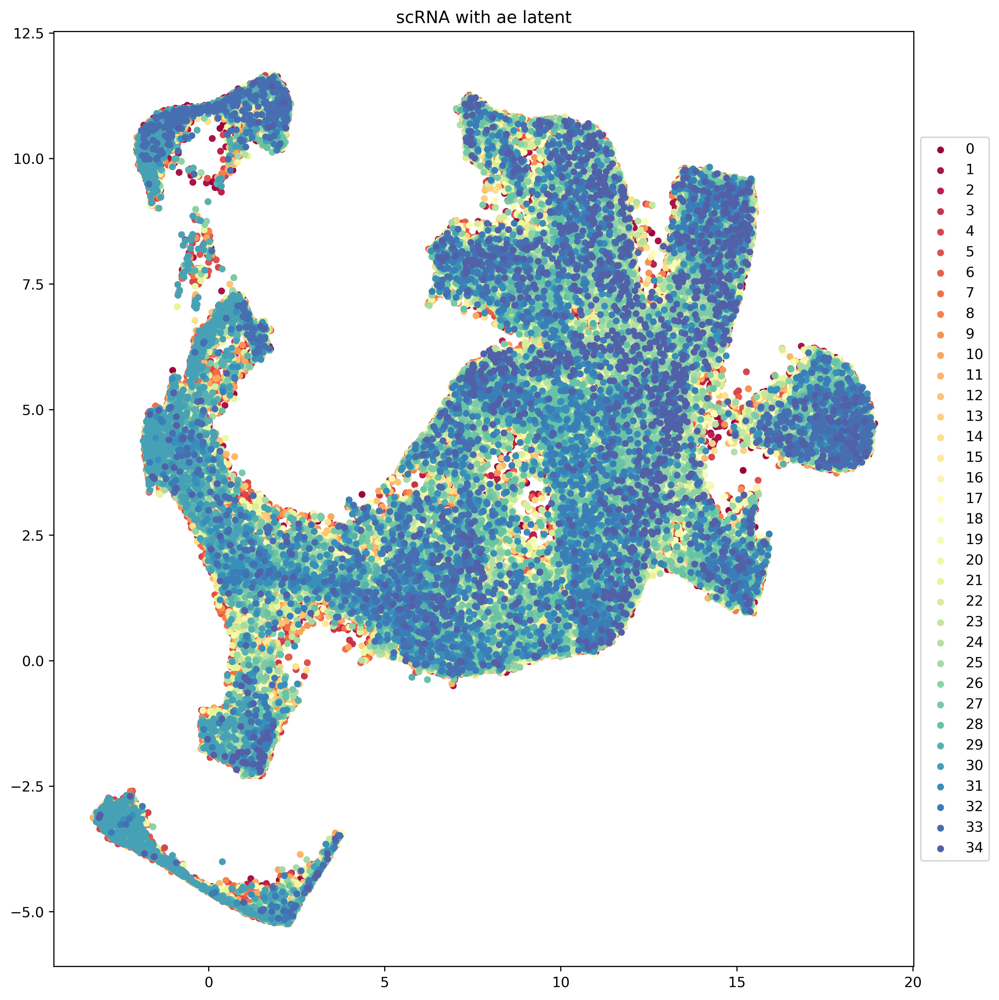

In [61]:
import matplotlib.colors as colors
import matplotlib.cm as cmx

types = np.unique(scRNA['cluster_ae'])
z = range(1,len(types))
hot = plt.get_cmap('Spectral')
cNorm  = colors.Normalize(vmin=0, vmax=len(types))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)

plt.figure(figsize=(10,10),dpi=500)
for i in range(len(types)):
    indx = scRNA['cluster_ae'] == types[i]
    plt.scatter(scRNA['V1'][indx], scRNA['V2'][indx], s=15, color=scalarMap.to_rgba(i), label=types[i])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title('scRNA with ae latent')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/cluster_ae.pdf',dpi=600)
#plt.legend(loc='right')

In [ ]:
import matplotlib.colors as colors
import matplotlib.cm as cmx

types = np.unique(scRNA['cluster_liger'])
z = range(1,len(types))
hot = plt.get_cmap('Spectral')
cNorm  = colors.Normalize(vmin=0, vmax=len(types))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)

plt.figure(figsize=(10,10),dpi=500)
for i in range(len(types)):
    indx = scRNA['cluster_liger'] == types[i]
    plt.scatter(scRNA['V1'][indx], scRNA['V2'][indx], s=15, color=scalarMap.to_rgba(i), label=types[i])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title('scRNA with liger latent')
#plt.legend(loc='right')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ML_project/Result/cluster_liger.pdf',dpi=600)
#plt.legend(loc='right')

Text(0.5, 1.0, 'scRNA with ae latent')

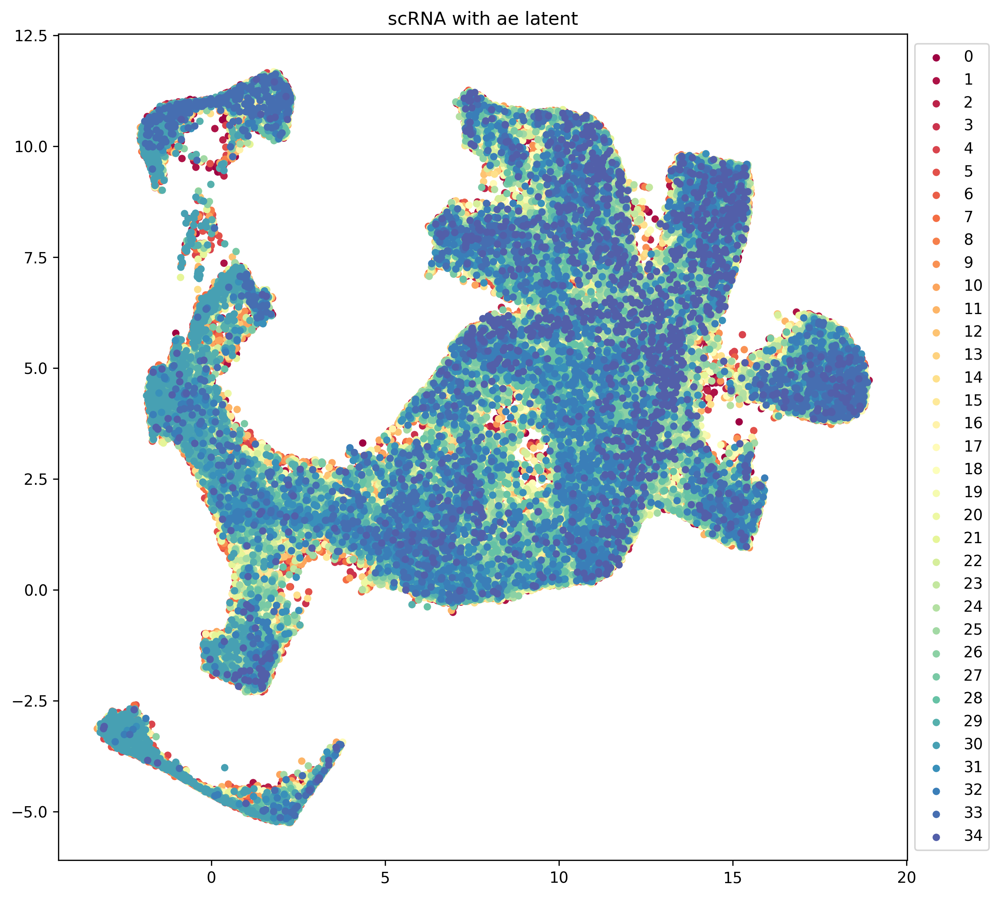

In [63]:
import matplotlib.colors as colors
import matplotlib.cm as cmx
z = range(1,len(types))
hot = plt.get_cmap('Spectral')
cNorm  = colors.Normalize(vmin=0, vmax=len(types))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)

plt.figure(figsize=(10,10),dpi=300)
for i in range(len(types)):
    indx = scRNA['cluster_ae'] == types[i]
    plt.scatter(scRNA['V1'][indx], scRNA['V2'][indx], s=15, color=scalarMap.to_rgba(i), label=types[i])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title('scRNA with ae latent')
#plt.legend(loc='right')

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


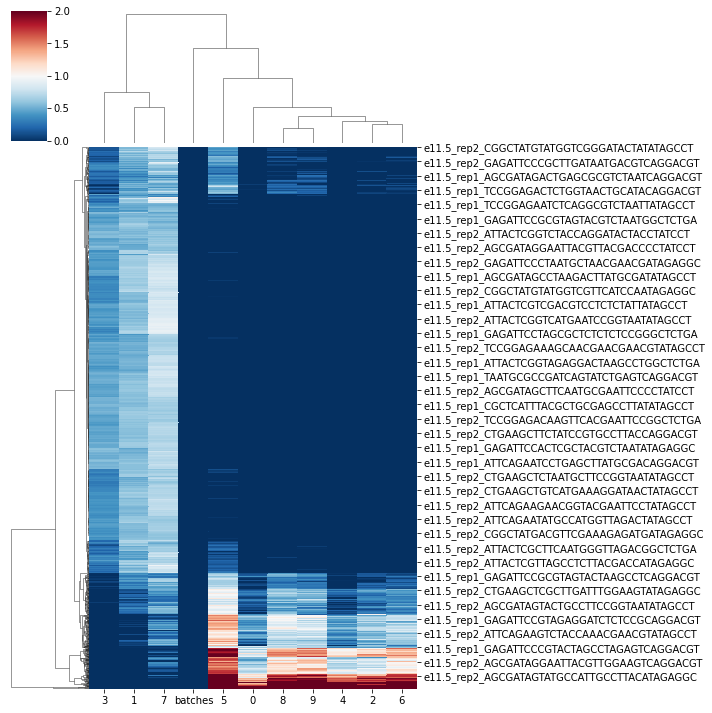

In [73]:
g=sns.clustermap(ae_latent_scATAC,vmax=2,cmap='RdBu_r')
ax = g.ax_heatmap
ax.set_ylabel("")
plt.savefig("/content/drive/MyDrive/ML_project/Result/cell_latent_scATAC.png",dpi = 500,bbox_inches="tight")

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


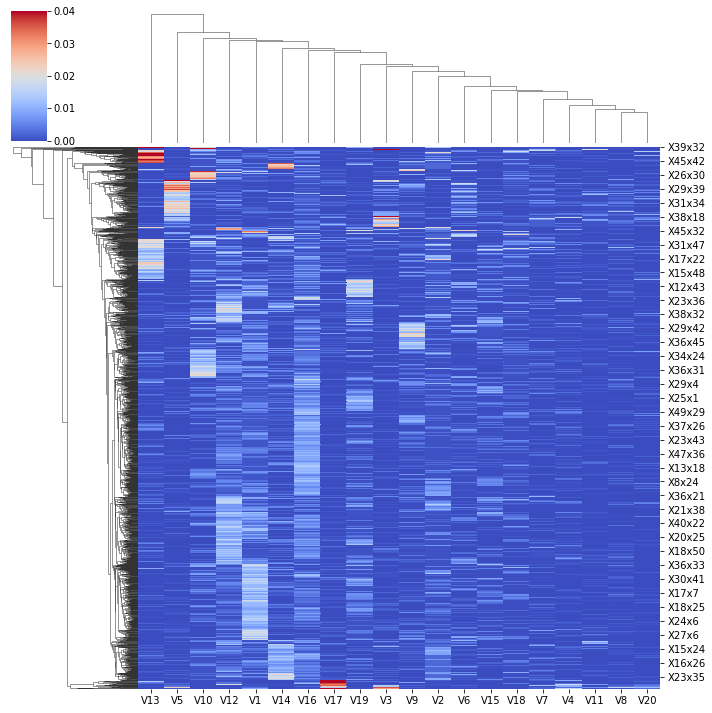

In [75]:
g=sns.clustermap(liger_latent_spatialRNA,vmax=0.04,cmap='coolwarm')
ax = g.ax_heatmap
ax.set_ylabel("")
plt.savefig("/content/drive/MyDrive/ML_project/Result/liger_latent_spatial.png",dpi = 500,bbox_inches="tight")

In [76]:
types = np.unique(scRNA['celltype.label'])

Text(0.5, 1.0, 'scRNA with original annotation')

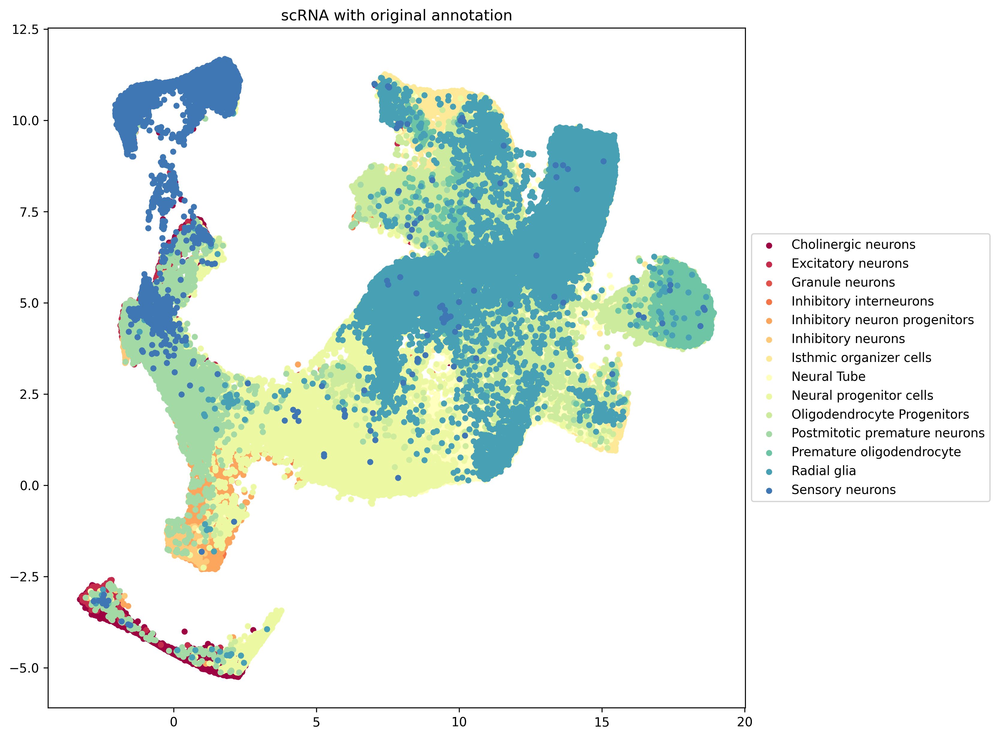

In [ ]:
import matplotlib.colors as colors
import matplotlib.cm as cmx
z = range(1,len(types))
hot = plt.get_cmap('Spectral')
cNorm  = colors.Normalize(vmin=0, vmax=len(types))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)

plt.figure(figsize=(10,10),dpi=300)
for i in range(len(types)):
    indx = scRNA['celltype.label'] == types[i]
    plt.scatter(scRNA['V1'][indx], scRNA['V2'][indx], s=15, color=scalarMap.to_rgba(i), label=types[i])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title('scRNA with original annotation')
#plt.legend(loc='right')

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(scRNA['V1'],scRNA['V2'],c=scRNA['celltype.label'])
plt.colorbar()
plt.gca().invert_yaxis()

In [90]:
scRNA

,V1,V2,batch.label,celltype.label,cell.coordinate.X,cell.coordinate.Y,cluster_ae
sci3-me-001.TACGGTAGTAAGACCGTTG,5.315276,3.155145,scRNA,Excitatory neurons,NaN,NaN,22
sci3-me-001.TATAAGAGGTCCAGTTCCAA,10.404022,2.883132,scRNA,Oligodendrocyte Progenitors,NaN,NaN,32
sci3-me-001.ATTAGTCTGTTATATACTAA,-0.551590,10.997453,scRNA,Sensory neurons,NaN,NaN,11
sci3-me-001.TCCAATAGTTTCTTGCCGAC,-1.400090,3.916351,scRNA,Postmitotic premature neurons,NaN,NaN,9
sci3-me-001.AAATTCCTCTAATACCATCC,-1.548965,4.698583,scRNA,Postmitotic premature neurons,NaN,NaN,9
...,...,...,...,...,...,...,...
sci3-me-760.TTCTCATTGTATCGGCTATC,1.069982,-0.335527,scRNA,Inhibitory neuron progenitors,NaN,NaN,23
sci3-me-760.GTCGGCAATAGAGAAGGTT,11.597528,8.508455,scRNA,Isthmic organizer cells,NaN,NaN,2
sci3-me-760.AGCATTATGTTTACCTCGAC,13.317905,7.626672,scRNA,Isthmic organizer cells,NaN,NaN,4
sci3-me-760.ACGCCATATCATTCGACGG,8.417939,7.770402,scRNA,Oligodendrocyte Progenitors,NaN,NaN,28


In [91]:
scRNA[scRNA['celltype.label']=='Cholinergic neurons']

,V1,V2,batch.label,celltype.label,cell.coordinate.X,cell.coordinate.Y,cluster_ae
sci3-me-001.AAATCGTTCTCCGATTCCTG,2.403032,1.794358,scRNA,Cholinergic neurons,NaN,NaN,14
sci3-me-001.TACTCCTATTCATCTCTGCA,-1.472204,-3.750297,scRNA,Cholinergic neurons,NaN,NaN,16
sci3-me-002.CCGGATAGTCATTCGACGG,0.763675,-4.848431,scRNA,Cholinergic neurons,NaN,NaN,26
sci3-me-002.TTCTCTCGTTATATACTAA,-1.862254,-3.309431,scRNA,Cholinergic neurons,NaN,NaN,7
sci3-me-002.TGACGAGGTCTAACTAGAT,1.222494,-5.043762,scRNA,Cholinergic neurons,NaN,NaN,3
...,...,...,...,...,...,...,...
sci3-me-759.TCCAATAGTTGGTACCGGCA,1.523630,-4.982958,scRNA,Cholinergic neurons,NaN,NaN,3
sci3-me-760.CCATCGTCTATAAGGAGCA,-1.115604,4.638010,scRNA,Cholinergic neurons,NaN,NaN,5
sci3-me-760.ATTCGCAATTAAGACCGTTG,2.497730,-4.789979,scRNA,Cholinergic neurons,NaN,NaN,10
sci3-me-760.ATCTTCAGATCGGATTAGAA,2.171601,-5.004473,scRNA,Cholinergic neurons,NaN,NaN,7


In [92]:
np.unique(scRNA[scRNA['celltype.label']=='Cholinergic neurons']['cluster_ae'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34])

In [93]:
np.unique(scRNA[scRNA['celltype.label']=='Excitatory neurons']['cluster_ae'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34])

In [94]:
np.unique(scRNA[scRNA['celltype.label']=='Granule neurons']['cluster_ae'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34])

In [79]:
from statistics import mode

In [95]:
spatialRNA.shape

(1789, 7)

In [ ]:
for i in range(spatialRNA.shape[0]):
    spatialRNA['celltype.label'][i]= mode(scRNA[scRNA['cluster_ae']==spatialRNA['cluster_ae'][i]]['celltype.label'])

In [97]:
spatialRNA

,V1,V2,batch.label,celltype.label,cell.coordinate.X,cell.coordinate.Y,cluster_ae
X41x14,7.731209,11.026641,spatialRNA,Neural Tube,41.0,14.0,2
X41x15,8.419341,9.730622,spatialRNA,Neural Tube,41.0,15.0,2
X41x16,14.790812,2.024226,spatialRNA,Neural Tube,41.0,16.0,8
X41x17,7.096626,3.606226,spatialRNA,Cholinergic neurons,41.0,17.0,4
X41x18,9.647465,4.863035,spatialRNA,Neural Tube,41.0,18.0,8
...,...,...,...,...,...,...,...
X42x40,10.711635,4.849454,spatialRNA,Neural Tube,42.0,40.0,2
X42x41,7.816103,10.978752,spatialRNA,Neural Tube,42.0,41.0,8
X42x42,11.070308,4.817314,spatialRNA,Neural progenitor cells,42.0,42.0,10
X42x43,11.230684,0.923611,spatialRNA,Neural Tube,42.0,43.0,2


In [ ]:
import seaborn as sns
plt.figure(figsize=(5,5),dpi=500)
g = sns.scatterplot(data=spatialRNA, x="cell.coordinate.X", y="cell.coordinate.Y", hue="celltype.label")
g.legend(loc='center left', bbox_to_anchor=(1.1, 0.5), ncol=1)
g.invert_yaxis()

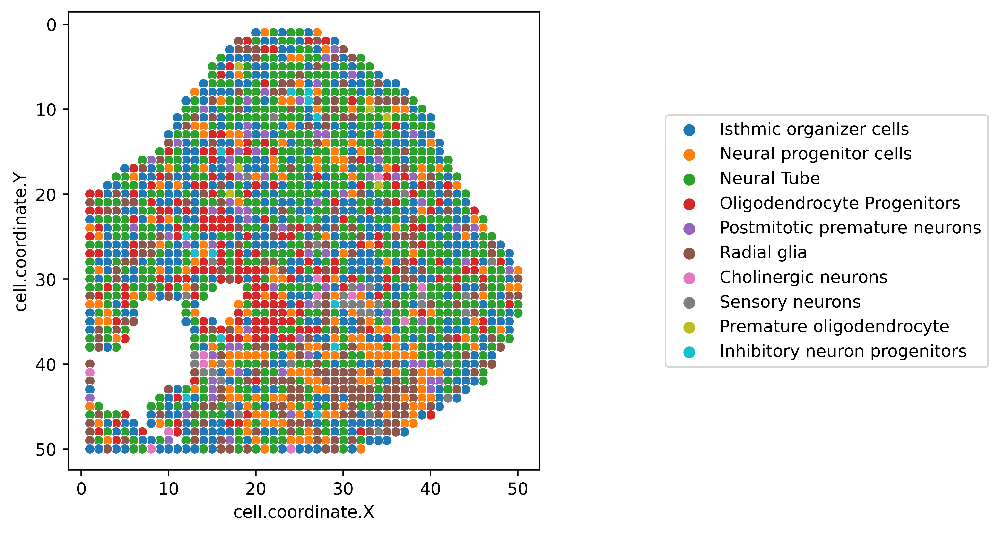

In [ ]:
import seaborn as sns
plt.figure(figsize=(5,5),dpi=500)
g = sns.scatterplot(data=spatialRNA, x="cell.coordinate.X", y="cell.coordinate.Y", hue="celltype.label")
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
g.invert_yaxis()

In [ ]:
scATAC

,V1,V2,batch.label,celltype.label,cell.coordinate.X,cell.coordinate.Y,cluster
e11.5_rep1_AGCGATAGAAGAGGCAAAGGCTATTATAGCCT,2.200133,-5.074555,scATAC,NaN,NaN,NaN,17
e11.5_rep1_AGCGATAGAAGAGGCACGTCTAATTATAGCCT,7.980112,10.164239,scATAC,NaN,NaN,NaN,14
e11.5_rep1_AGCGATAGAAGAGGCACTAAGCCTTATAGCCT,8.162387,7.372157,scATAC,NaN,NaN,NaN,3
e11.5_rep1_AGCGATAGACTCGCTACTCTCTATATAGAGGC,-2.764580,-2.935398,scATAC,NaN,NaN,NaN,19
e11.5_rep1_AGCGATAGACTCGCTATTATGCGAATAGAGGC,0.086042,-4.635429,scATAC,NaN,NaN,NaN,17
...,...,...,...,...,...,...,...
e11.5_rep2_TCCGGAGATTAGCCTCAACGAACGTATAGCCT,2.681874,2.066367,scATAC,NaN,NaN,NaN,7
e11.5_rep2_TCCGGAGATTAGCCTCAATGACGTTATAGCCT,11.437905,9.232384,scATAC,NaN,NaN,NaN,6
e11.5_rep2_TCCGGAGATTAGCCTCTAAGATCCTATAGCCT,10.714850,10.293164,scATAC,NaN,NaN,NaN,6
e11.5_rep2_TCCGGAGATTCCATCCGAAGTATGTATAGCCT,7.877602,10.418756,scATAC,NaN,NaN,NaN,14


In [99]:
from sklearn.neighbors import NearestNeighbors

In [100]:
ae_latent_spatialRNA

,0,1,2,3,4,5,6,7,8,9,batches
41x14,0.0,0.736227,0.000000,0.366355,0.0,0.000000,0.0,0.680544,0.000000,0.0,2
41x15,0.0,0.662367,0.000000,0.335799,0.0,0.000000,0.0,0.709371,0.000000,0.0,2
41x16,0.0,0.619013,0.000000,0.499169,0.0,0.000000,0.0,0.657949,0.000000,0.0,2
41x17,0.0,0.600360,0.000000,0.480363,0.0,0.000000,0.0,0.746897,0.000000,0.0,2
41x18,0.0,0.584083,0.000000,0.544020,0.0,0.000000,0.0,0.644762,0.000000,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...
42x40,0.0,0.711192,0.000000,0.367399,0.0,0.000000,0.0,0.759278,0.000000,0.0,2
42x41,0.0,0.553048,0.000000,0.496664,0.0,0.000000,0.0,0.679077,0.000000,0.0,2
42x42,0.0,0.718056,0.000000,0.261873,0.0,0.000000,0.0,0.943902,0.000000,0.0,2
42x43,0.0,0.642050,0.000000,0.289180,0.0,0.000000,0.0,0.665938,0.000000,0.0,2


In [104]:
ae_latent_spatialRNA.iloc[0][:-1]

0    0.000000
1    0.736227
2    0.000000
3    0.366355
4    0.000000
5    0.000000
6    0.000000
7    0.680544
8    0.000000
9    0.000000
Name: 41x14, dtype: float64

In [ ]:
predited_type = []
for i in range(ae_latent_spatialRNA.shape[0]):
    print(i)
    data_sp = np.array(ae_latent_spatialRNA)[i,:10]
    data_sc = np.array(ae_latent_scRNA)[:,:10]
    data = np.concatenate([data_sp[None,:],data_sc])
    nbrs = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(data)
    distances, indices = nbrs.kneighbors(data)
    predited_type.append(indices[0])

In [155]:
predited_ATAC = []
for i in range(ae_latent_spatialRNA.shape[0]):
    data_sp = np.array(ae_latent_spatialRNA)[i,:10]
    data_sc = np.array(ae_latent_scATAC)[:,:10]
    data = np.concatenate([data_sp[None,:],data_sc])
    nbrs = NearestNeighbors(n_neighbors=11, algorithm='ball_tree').fit(data)
    distances, indices = nbrs.kneighbors(data)
    predited_ATAC.append([indices[0]])

In [157]:
predited_ATAC = np.array(predited_ATAC)
predited_ATAC = predited_ATAC.squeeze(axis=1)

In [176]:
assorted_ATAC = np.array(ae_latent_scATAC)[predited_ATAC[:,1]-1][:,:10]

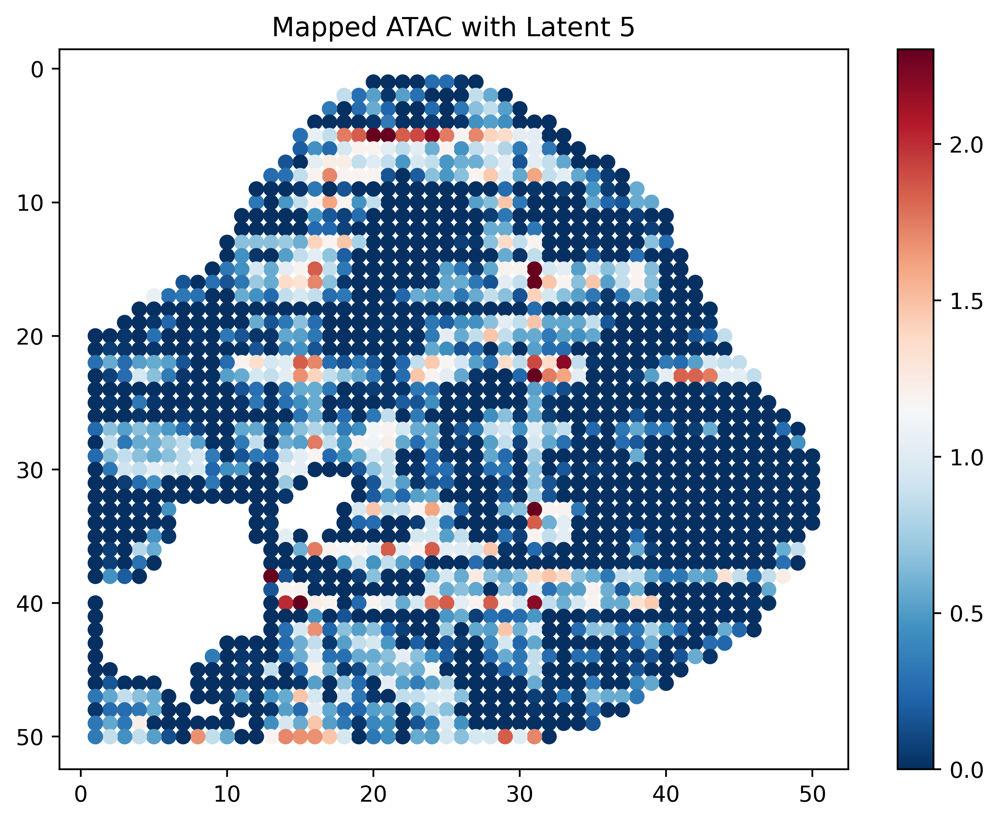

In [195]:
# plot one figure
l_name = 5
plt.figure(figsize=(8,6),dpi=500)
plt.scatter(spatialRNA['cell.coordinate.X'],spatialRNA['cell.coordinate.Y'],cmap='RdBu_r',c=assorted_ATAC[:,l_name])
plt.colorbar()
plt.title('Mapped ATAC with Latent 5')
plt.gca().invert_yaxis()